In [1]:
import os
import json
import torch
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import segmentation_models_pytorch as smp

from sateImageDataset import get_datasets
from models import DeepLabV3Plus, UNet, UANet, Encoder
from logger import Logger
from metrics import Metrics

torch.manual_seed(42)
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [2]:
BATCH_SIZE = 32 #FIXED
LEARNING_RATE = 0.001
EPOCH = 50 #FIXED
PATIENCE = 3 #FIXED
FACTOR = 0.1 #FIXED
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
TEST_K = 1

In [3]:
train_dataset, val_dataset, test_dataset = get_datasets(TEST_K)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=os.cpu_count())
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=os.cpu_count())
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=os.cpu_count())

In [7]:
model = UANet().to(DEVICE)

loss_fn = smp.losses.DiceLoss(mode="binary", from_logits=False)

optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=PATIENCE, factor=FACTOR)
metrics = Metrics()

From resnet50-11ad3fa6.pth Load resnet50 Weights Succeed!


Background: {'iou': 0.20250113308429718, 'precision': 0.9974929690361023, 'recall': 0.2026042491197586, 'f1score': 0.33679988980293274}
Building: {'iou': 0.003928766120225191, 'precision': 0.0039312648586928844, 'recall': 0.8607329726219177, 'f1score': 0.007826782763004303}


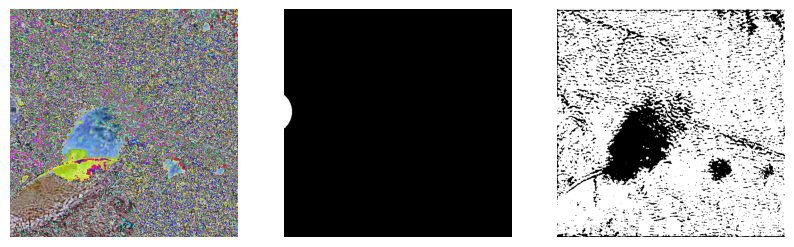

Background: {'iou': 0.4832402467727661, 'precision': 0.9662876725196838, 'recall': 0.49152716994285583, 'f1score': 0.6516007781028748}
Building: {'iou': 0.1797659695148468, 'precision': 0.184708833694458, 'recall': 0.870426595211029, 'f1score': 0.3047485053539276}


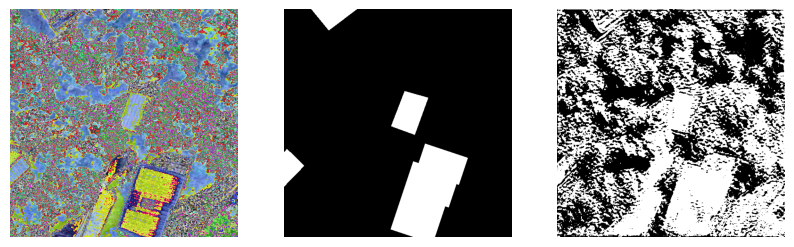

Background: {'iou': 0.31062930822372437, 'precision': 0.9468942284584045, 'recall': 0.3161368668079376, 'f1score': 0.4740155041217804}
Building: {'iou': 0.16825047135353088, 'precision': 0.17186294496059418, 'recall': 0.8889443278312683, 'f1score': 0.28803834319114685}


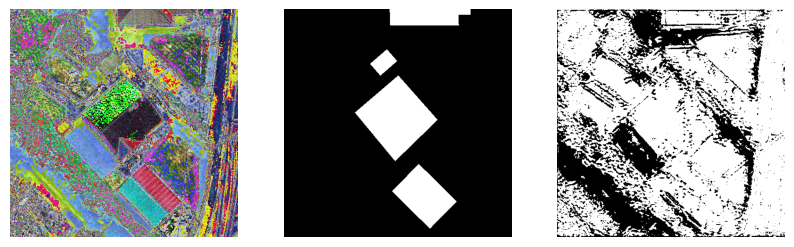

Background: {'iou': 0.466208815574646, 'precision': 0.9617188572883606, 'recall': 0.4750240445137024, 'f1score': 0.6359378099441528}
Building: {'iou': 0.14395621418952942, 'precision': 0.1483718454837799, 'recall': 0.8286832571029663, 'f1score': 0.2516813278198242}


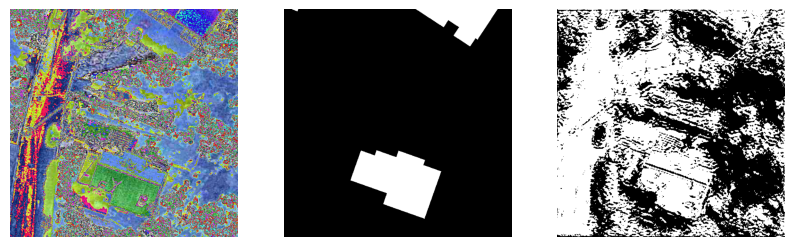

Background: {'iou': 0.42398008704185486, 'precision': 0.9715321063995361, 'recall': 0.42931365966796875, 'f1score': 0.5954859852790833}
Building: {'iou': 0.05556022748351097, 'precision': 0.05671549215912819, 'recall': 0.7317322492599487, 'f1score': 0.10527154058218002}


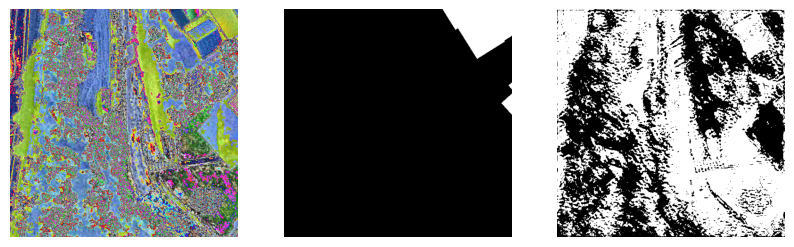

Background: {'iou': 0.3734506666660309, 'precision': 0.9215863943099976, 'recall': 0.3857065737247467, 'f1score': 0.5438137054443359}
Building: {'iou': 0.2997658848762512, 'precision': 0.3108031451702118, 'recall': 0.8940815925598145, 'f1score': 0.4612613618373871}


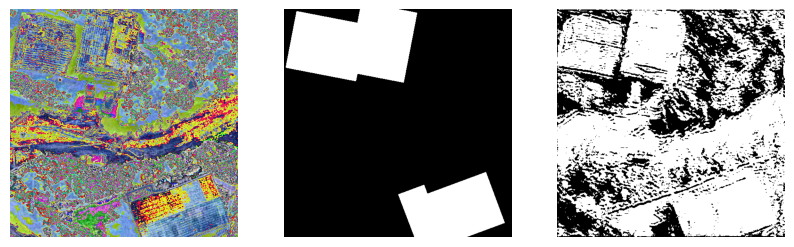

Background: {'iou': 0.4673095941543579, 'precision': 0.9871309995651245, 'recall': 0.47017398476600647, 'f1score': 0.6369611024856567}
Building: {'iou': 0.014057553373277187, 'precision': 0.014217873103916645, 'recall': 0.5549002885818481, 'f1score': 0.027725355699658394}


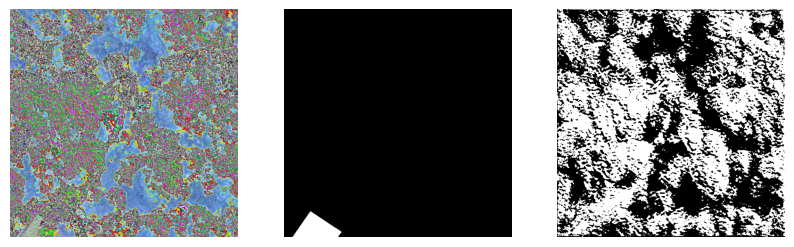

Background: {'iou': 0.3203233778476715, 'precision': 0.9952077269554138, 'recall': 0.3208182454109192, 'f1score': 0.4852195978164673}
Building: {'iou': 0.008524524047970772, 'precision': 0.008543748408555984, 'recall': 0.7911688089370728, 'f1score': 0.016904940828680992}


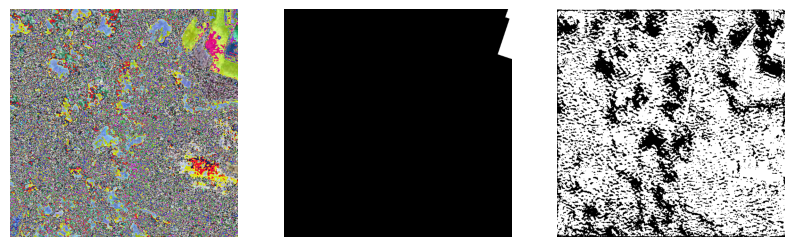

Background: {'iou': 0.49328264594078064, 'precision': 0.8641169667243958, 'recall': 0.534763753414154, 'f1score': 0.6606688499450684}
Building: {'iou': 0.32227224111557007, 'precision': 0.3595775365829468, 'recall': 0.7564723491668701, 'f1score': 0.4874521791934967}


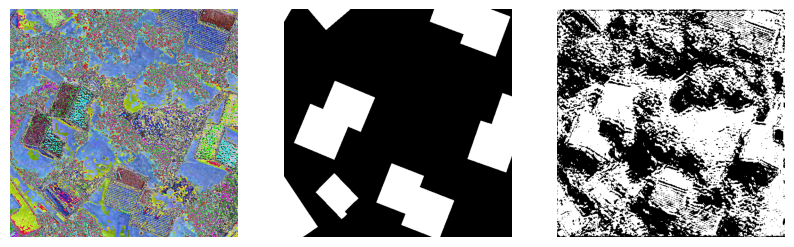

Background: {'iou': 0.34968701004981995, 'precision': 0.8870450854301453, 'recall': 0.3659837543964386, 'f1score': 0.518174946308136}
Building: {'iou': 0.22768770158290863, 'precision': 0.24040062725543976, 'recall': 0.8115186095237732, 'f1score': 0.37092122435569763}


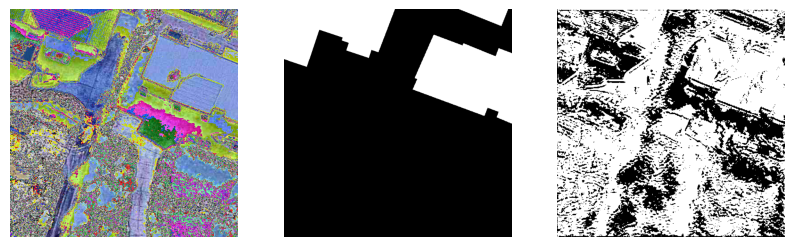

Background: {'iou': 0.488039493560791, 'precision': 0.9966289401054382, 'recall': 0.48884648084640503, 'f1score': 0.6559496521949768}
Building: {'iou': 0.02119312807917595, 'precision': 0.021260226145386696, 'recall': 0.8703815937042236, 'f1score': 0.04150659963488579}


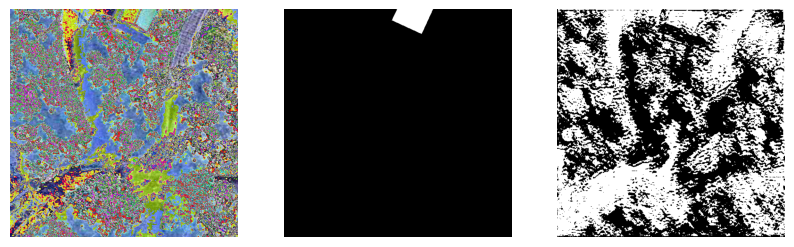

Background: {'iou': 0.556502640247345, 'precision': 0.941596269607544, 'recall': 0.5763986706733704, 'f1score': 0.7150680422782898}
Building: {'iou': 0.26973405480384827, 'precision': 0.2859888970851898, 'recall': 0.8259575366973877, 'f1score': 0.42486700415611267}


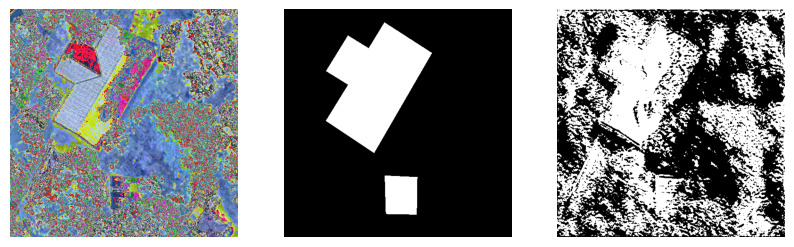

Background: {'iou': 0.6111953258514404, 'precision': 0.9708150029182434, 'recall': 0.6226356029510498, 'f1score': 0.7586855888366699}
Building: {'iou': 0.21058480441570282, 'precision': 0.21874527633190155, 'recall': 0.8495068550109863, 'f1score': 0.3479059040546417}


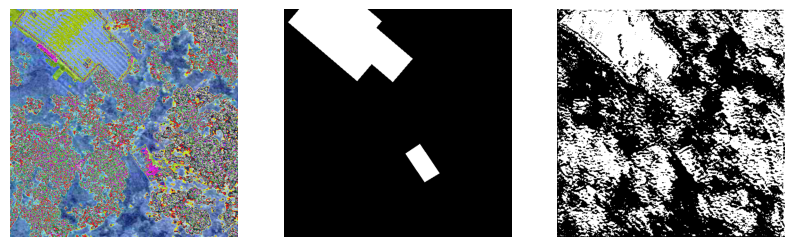

Background: {'iou': 0.2983279824256897, 'precision': 0.9266942143440247, 'recall': 0.3055384159088135, 'f1score': 0.4595571756362915}
Building: {'iou': 0.3106807470321655, 'precision': 0.3180544376373291, 'recall': 0.9305596351623535, 'f1score': 0.47407540678977966}


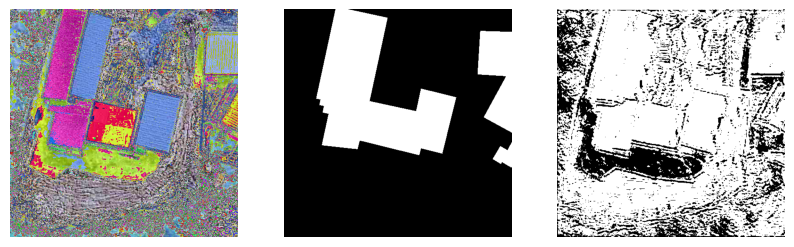

Background: {'iou': 0.45038479566574097, 'precision': 0.8851821422576904, 'recall': 0.4783287048339844, 'f1score': 0.6210556030273438}
Building: {'iou': 0.4696408212184906, 'precision': 0.4976975917816162, 'recall': 0.8928296566009521, 'f1score': 0.639123260974884}


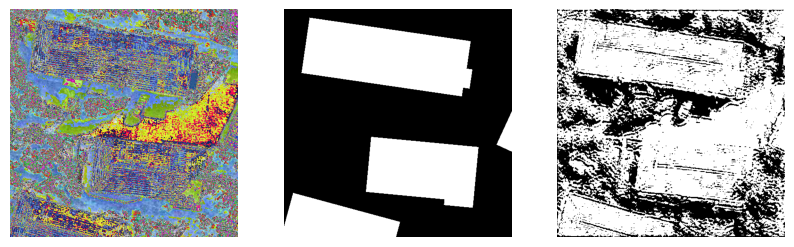

Background: {'iou': 0.2979888617992401, 'precision': 0.9341883659362793, 'recall': 0.30437856912612915, 'f1score': 0.45915472507476807}
Building: {'iou': 0.12464486807584763, 'precision': 0.1279953122138977, 'recall': 0.8264414072036743, 'f1score': 0.22166085243225098}


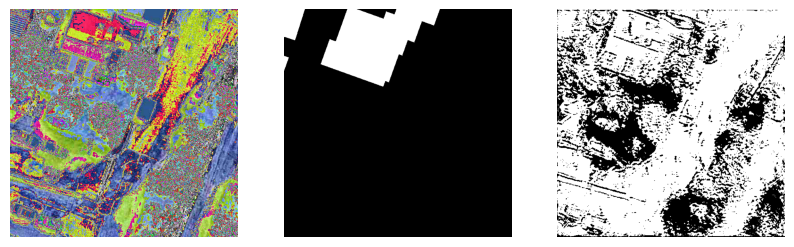

Background: {'iou': 0.3470490872859955, 'precision': 0.8780189156532288, 'recall': 0.3646295666694641, 'f1score': 0.5152730941772461}
Building: {'iou': 0.36758649349212646, 'precision': 0.3855929970741272, 'recall': 0.8872799277305603, 'f1score': 0.5375696420669556}


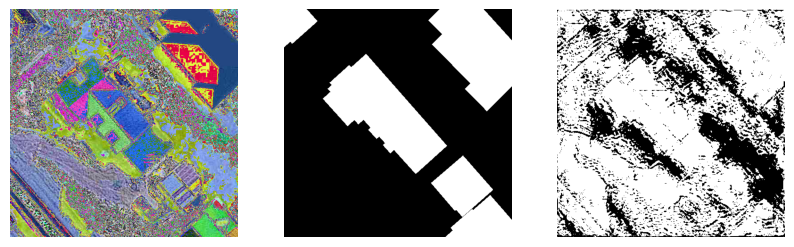

Background: {'iou': 0.4648018181324005, 'precision': 0.9856219291687012, 'recall': 0.4679749011993408, 'f1score': 0.6346275806427002}
Building: {'iou': 0.041699282824993134, 'precision': 0.04221176728606224, 'recall': 0.7745034694671631, 'f1score': 0.08006011694669724}


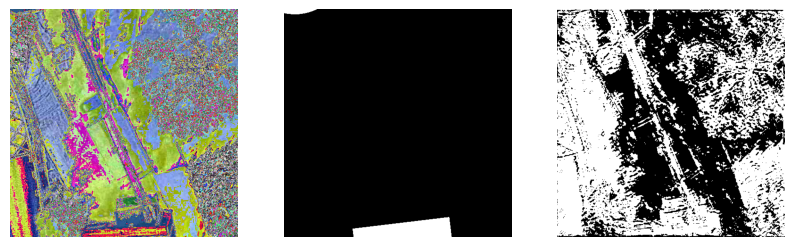

Background: {'iou': 0.3221184313297272, 'precision': 0.9565794467926025, 'recall': 0.32689812779426575, 'f1score': 0.48727619647979736}
Building: {'iou': 0.12269815802574158, 'precision': 0.12506473064422607, 'recall': 0.8663842678070068, 'f1score': 0.2185772955417633}


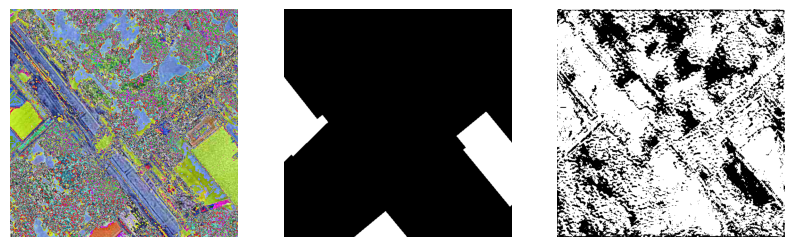

Background: {'iou': 0.3823491632938385, 'precision': 0.8396722674369812, 'recall': 0.4124613404273987, 'f1score': 0.5531875491142273}
Building: {'iou': 0.4952186048030853, 'precision': 0.5266405940055847, 'recall': 0.892473042011261, 'f1score': 0.6624029278755188}


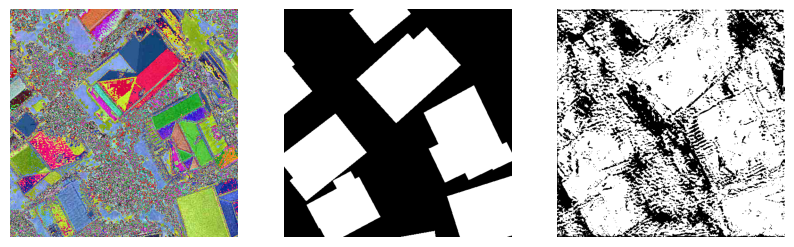

Background: {'iou': 0.15420667827129364, 'precision': 0.9574921131134033, 'recall': 0.15526965260505676, 'f1score': 0.267208069562912}
Building: {'iou': 0.1149560734629631, 'precision': 0.11578553169965744, 'recall': 0.9413386583328247, 'f1score': 0.20620736479759216}


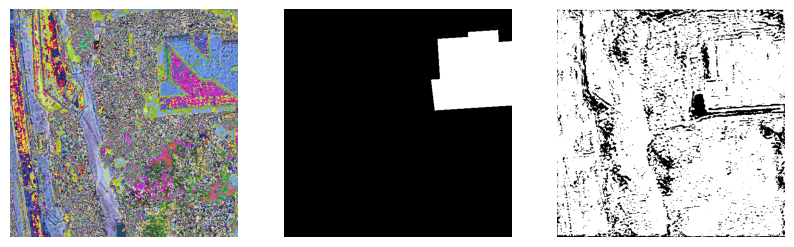

Background: {'iou': 0.2800685167312622, 'precision': 0.9583926796913147, 'recall': 0.28351572155952454, 'f1score': 0.4375836253166199}
Building: {'iou': 0.15959525108337402, 'precision': 0.1618930697441101, 'recall': 0.9183292984962463, 'f1score': 0.2752602696418762}


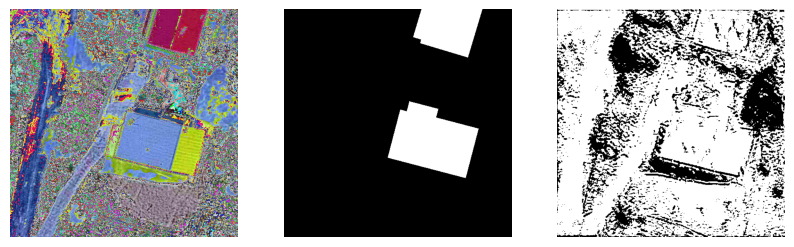

Background: {'iou': 0.4809717535972595, 'precision': 0.9397411942481995, 'recall': 0.4962775707244873, 'f1score': 0.6495353579521179}
Building: {'iou': 0.30983757972717285, 'precision': 0.3230874538421631, 'recall': 0.8831111192703247, 'f1score': 0.4730931222438812}


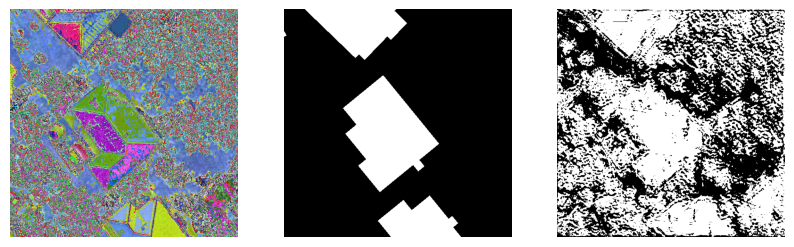

Background: {'iou': 0.2668167054653168, 'precision': 0.9165037274360657, 'recall': 0.27346399426460266, 'f1score': 0.4212396442890167}
Building: {'iou': 0.1592736542224884, 'precision': 0.1638404130935669, 'recall': 0.8510621190071106, 'f1score': 0.2747817933559418}


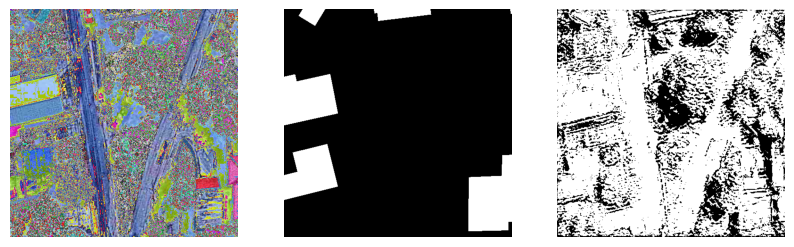

Background: {'iou': 0.40901443362236023, 'precision': 0.9216752052307129, 'recall': 0.4237430691719055, 'f1score': 0.5805681347846985}
Building: {'iou': 0.3173379898071289, 'precision': 0.3306121826171875, 'recall': 0.8876877427101135, 'f1score': 0.4817867577075958}


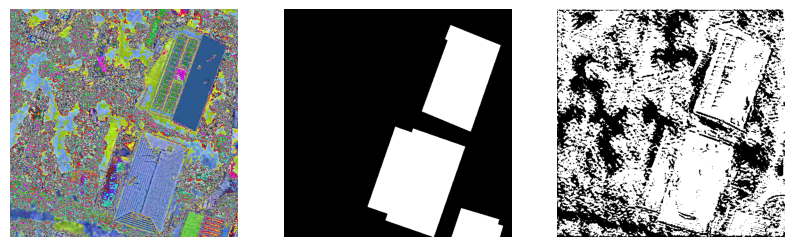

In [8]:
model.eval()
with torch.no_grad():
    for i in range(25):
        X, Y = test_dataset.__getitem__(i)
        X, Y = X.to(DEVICE).unsqueeze(0), Y.to(DEVICE).unsqueeze(0)
        
        pred = model(X)
        
        m = metrics(pred, Y.to(torch.long))
        
        print("=========================================================")
        print(f"Background: {m['background']}")
        print(f"Building: {m['building']}")
        
        _, ax = plt.subplots(1, 3, figsize=(10, 5))
        
        ax[0].imshow(transforms.ToPILImage()(X[0]))
        ax[1].imshow(transforms.ToPILImage()(Y.argmax(dim=1).float()), cmap="gray")
        ax[2].imshow(transforms.ToPILImage()(pred.argmax(dim=1).float()), cmap="gray")
        
        ax[0].axis("off")
        ax[1].axis("off")
        ax[2].axis("off")
        
        plt.show()

In [9]:
logger = Logger(model.architecture, model.backbone + f"_K_{str(TEST_K)}")
logger.log(f"Loss Function: DiceLoss")
logger.log(f"Optimizer: {str(optimizer)}")
logger.log(f"Schedular: {str(scheduler)}")
logger.log(f"Patience: {PATIENCE}")
logger.log(f"Factor: {FACTOR}")
logger.log(f"Learning Rate: {LEARNING_RATE}")
logger.log(f"Batch Size: {BATCH_SIZE}")
logger.log(f"Max Epoch: {EPOCH}")
logger.log(f"Device: {DEVICE}")
logger.log(f"Test K: {TEST_K}")
logger.log(f"Train: {len(train_dataset)}, Validation: {len(val_dataset)}, Test: {len(test_dataset)}")
logger.log("")
logger.log("Starting Training")
logger.log("")

In [10]:
VAL_LOSS_PRECISION = 0.00001
VAL_LOSS_MIN = 10e10
BEST_MODEL_EPOCH = 0

logs = {
    "lr": [],
    "train": {
        "loss": [],
        "background": {
            "iou": [],
            "precision": [],
            "recall": [],
            "f1score": []
        },
        "building": {
            "iou": [],
            "precision": [],
            "recall": [],
            "f1score": []
        }
    },
     "validation": {
        "loss": [],
        "background": {
            "iou": [],
            "precision": [],
            "recall": [],
            "f1score": []
        },
        "building": {
            "iou": [],
            "precision": [],
            "recall": [],
            "f1score": []
        }
    }
}

In [11]:
for e in range(EPOCH):
    
    logger.log(f"[{e+1}/{EPOCH}]")
    print(f"[{e+1}/{EPOCH}]")
    
    logs["lr"].append(scheduler.optimizer.param_groups[0]['lr'])
    logger.log(f"  lr={scheduler.optimizer.param_groups[0]['lr']}")
    print(f"  lr={scheduler.optimizer.param_groups[0]['lr']}")
    
    logger.log("  [TRAIN]")
    model.train()
    running_items = 0
    running_loss = 0
    running_metrics = {
        "background": {
            "iou": 0,
            "precision": 0,
            "recall": 0,
            "f1score": 0
        },
        "building": {
            "iou": 0,
            "precision": 0,
            "recall": 0,
            "f1score": 0
        }
    }
    for X, Y in tqdm(train_loader):
        X, Y = X.to(DEVICE), Y.to(DEVICE)

        optimizer.zero_grad()

        pred = model(X)
        
        loss = loss_fn(pred, Y)
        loss.backward()
        optimizer.step()
        
        m = metrics(pred, Y.to(torch.long))
        running_items += m["batch_size"]
        running_loss += loss.item()
        for key, value in m["background"].items():
            running_metrics["background"][key] += value
            
        for key, value in m["building"].items():
            running_metrics["building"][key] += value
    
    
    logs["train"]["loss"].append(running_loss / running_items)
    logger.log(f"    Loss: {running_loss / running_items}")
    
    for key, value in running_metrics["background"].items():
        logs["train"]["background"][key].append(value / running_items)
        logger.log(f"    Background {key}: {value / running_items}")
        
    for key, value in running_metrics["building"].items():
        logs["train"]["building"][key].append(value / running_items)
        logger.log(f"    Building {key}: {value / running_items}")
        
    print(f'  [TRAIN] Loss: {running_loss / running_items:.6f}, mIoU(Buidling): {running_metrics["building"]["iou"] / running_items:.4f}')
    
    logger.log("  [VALIDATION]")
    model.eval()
    running_items = 0
    running_loss = 0
    running_metrics = {
        "background": {
            "iou": 0,
            "precision": 0,
            "recall": 0,
            "f1score": 0
        },
        "building": {
            "iou": 0,
            "precision": 0,
            "recall": 0,
            "f1score": 0
        }
    }
    with torch.no_grad():
        for X, Y in tqdm(val_loader):
            X, Y = X.to(DEVICE), Y.to(DEVICE)
            
            pred = model(X)
        
            loss = loss_fn(pred, Y)
            
            m = metrics(pred, Y.to(torch.long))
            running_items += m["batch_size"]
            running_loss += loss.item()
            for key, value in m["background"].items():
                running_metrics["background"][key] += value

            for key, value in m["building"].items():
                running_metrics["building"][key] += value
            
    
    scheduler.step(running_loss / running_items)
    
    logs["validation"]["loss"].append(running_loss / running_items)
    logger.log(f"    Loss: {running_loss / running_items}")
    
    for key, value in running_metrics["background"].items():
        logs["validation"]["background"][key].append(value / running_items)
        logger.log(f"    Background {key}: {value / running_items}")
        
    for key, value in running_metrics["building"].items():
        logs["validation"]["building"][key].append(value / running_items)
        logger.log(f"    Building {key}: {value / running_items}")
        
    print(f'  [VALIDATION] Loss: {running_loss / running_items:.6f}, mIoU(Buidling): {running_metrics["building"]["iou"] / running_items:.4f}')
    
    torch.save({
        'epoch': e+1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
    }, os.path.join(logger.folder, f"model_{e+1}.pt"))
    
    if running_loss / running_items < VAL_LOSS_MIN:
        VAL_LOSS_MIN = running_loss / running_items
        BEST_MODEL_EPOCH = e+1
    
    
    if len(logs["validation"]["loss"]) >= 10:
        last_10 = logs["validation"]["loss"][-10:]
        if abs(max(last_10) - min(last_10)) < VAL_LOSS_PRECISION:
            logger.log(f"Early Stop")
            break 

logger.log(f"Best Epoch: {BEST_MODEL_EPOCH}")

[1/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:29<00:00,  3.61s/it]  


  [TRAIN] Loss: 0.001234, mIoU(Buidling): 0.7778


100%|██████████| 250/250 [04:03<00:00,  1.03it/s]


  [VALIDATION] Loss: 0.000973, mIoU(Buidling): 0.8089
[2/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:24<00:00,  3.64s/it]  


  [TRAIN] Loss: 0.000960, mIoU(Buidling): 0.8146


100%|██████████| 250/250 [03:26<00:00,  1.21it/s]


  [VALIDATION] Loss: 0.000937, mIoU(Buidling): 0.8174
[3/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:55<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000903, mIoU(Buidling): 0.8226


100%|██████████| 250/250 [03:20<00:00,  1.25it/s]


  [VALIDATION] Loss: 0.000877, mIoU(Buidling): 0.8252
[4/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:52<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000870, mIoU(Buidling): 0.8265


100%|██████████| 250/250 [03:16<00:00,  1.27it/s]


  [VALIDATION] Loss: 0.000857, mIoU(Buidling): 0.8267
[5/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:54<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000842, mIoU(Buidling): 0.8321


100%|██████████| 250/250 [03:29<00:00,  1.19it/s]


  [VALIDATION] Loss: 0.000837, mIoU(Buidling): 0.8320
[6/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:24<00:00,  3.64s/it]  


  [TRAIN] Loss: 0.000820, mIoU(Buidling): 0.8351


100%|██████████| 250/250 [04:03<00:00,  1.03it/s]


  [VALIDATION] Loss: 0.000834, mIoU(Buidling): 0.8339
[7/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:34<00:00,  3.64s/it]  


  [TRAIN] Loss: 0.000801, mIoU(Buidling): 0.8372


100%|██████████| 250/250 [04:02<00:00,  1.03it/s]


  [VALIDATION] Loss: 0.000812, mIoU(Buidling): 0.8352
[8/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:32<00:00,  3.64s/it]  


  [TRAIN] Loss: 0.000787, mIoU(Buidling): 0.8393


100%|██████████| 250/250 [04:04<00:00,  1.02it/s]


  [VALIDATION] Loss: 0.000804, mIoU(Buidling): 0.8387
[9/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:45<00:00,  3.65s/it]  


  [TRAIN] Loss: 0.000779, mIoU(Buidling): 0.8407


100%|██████████| 250/250 [04:02<00:00,  1.03it/s]


  [VALIDATION] Loss: 0.000792, mIoU(Buidling): 0.8374
[10/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:43<00:00,  3.65s/it]  


  [TRAIN] Loss: 0.000769, mIoU(Buidling): 0.8423


100%|██████████| 250/250 [04:01<00:00,  1.03it/s]


  [VALIDATION] Loss: 0.000785, mIoU(Buidling): 0.8391
[11/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:30<00:00,  3.64s/it]  


  [TRAIN] Loss: 0.000760, mIoU(Buidling): 0.8424


100%|██████████| 250/250 [03:25<00:00,  1.22it/s]


  [VALIDATION] Loss: 0.000765, mIoU(Buidling): 0.8431
[12/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:49<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000761, mIoU(Buidling): 0.8435


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


  [VALIDATION] Loss: 0.000775, mIoU(Buidling): 0.8421
[13/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:48<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000744, mIoU(Buidling): 0.8450


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


  [VALIDATION] Loss: 0.000762, mIoU(Buidling): 0.8431
[14/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:45<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000745, mIoU(Buidling): 0.8453


100%|██████████| 250/250 [03:36<00:00,  1.16it/s]


  [VALIDATION] Loss: 0.000759, mIoU(Buidling): 0.8431
[15/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:44<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000736, mIoU(Buidling): 0.8472


100%|██████████| 250/250 [03:34<00:00,  1.16it/s]


  [VALIDATION] Loss: 0.000755, mIoU(Buidling): 0.8460
[16/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:41<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000731, mIoU(Buidling): 0.8477


100%|██████████| 250/250 [03:34<00:00,  1.17it/s]


  [VALIDATION] Loss: 0.000755, mIoU(Buidling): 0.8450
[17/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:47<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000724, mIoU(Buidling): 0.8492


100%|██████████| 250/250 [03:31<00:00,  1.18it/s]


  [VALIDATION] Loss: 0.000747, mIoU(Buidling): 0.8446
[18/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:50<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000721, mIoU(Buidling): 0.8495


100%|██████████| 250/250 [03:35<00:00,  1.16it/s]


  [VALIDATION] Loss: 0.000737, mIoU(Buidling): 0.8493
[19/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:49<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000715, mIoU(Buidling): 0.8506


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


  [VALIDATION] Loss: 0.000755, mIoU(Buidling): 0.8436
[20/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:50<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000709, mIoU(Buidling): 0.8510


100%|██████████| 250/250 [03:38<00:00,  1.14it/s]


  [VALIDATION] Loss: 0.000737, mIoU(Buidling): 0.8493
[21/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:47<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000704, mIoU(Buidling): 0.8520


100%|██████████| 250/250 [03:38<00:00,  1.15it/s]


  [VALIDATION] Loss: 0.000741, mIoU(Buidling): 0.8444
[22/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:01<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000705, mIoU(Buidling): 0.8520


100%|██████████| 250/250 [03:45<00:00,  1.11it/s]


  [VALIDATION] Loss: 0.000733, mIoU(Buidling): 0.8489
[23/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:54<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000701, mIoU(Buidling): 0.8533


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


  [VALIDATION] Loss: 0.000729, mIoU(Buidling): 0.8499
[24/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:44<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000699, mIoU(Buidling): 0.8531


100%|██████████| 250/250 [03:36<00:00,  1.16it/s]


  [VALIDATION] Loss: 0.000727, mIoU(Buidling): 0.8482
[25/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:38<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000694, mIoU(Buidling): 0.8538


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


  [VALIDATION] Loss: 0.000738, mIoU(Buidling): 0.8489
[26/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:54<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000691, mIoU(Buidling): 0.8548


100%|██████████| 250/250 [04:03<00:00,  1.02it/s]


  [VALIDATION] Loss: 0.000730, mIoU(Buidling): 0.8506
[27/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:55<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000689, mIoU(Buidling): 0.8548


100%|██████████| 250/250 [04:02<00:00,  1.03it/s]


  [VALIDATION] Loss: 0.000723, mIoU(Buidling): 0.8527
[28/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:58<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000684, mIoU(Buidling): 0.8549


100%|██████████| 250/250 [04:05<00:00,  1.02it/s]


  [VALIDATION] Loss: 0.000722, mIoU(Buidling): 0.8510
[29/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:10<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000686, mIoU(Buidling): 0.8549


100%|██████████| 250/250 [04:04<00:00,  1.02it/s]


  [VALIDATION] Loss: 0.000723, mIoU(Buidling): 0.8490
[30/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:17<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000680, mIoU(Buidling): 0.8563


100%|██████████| 250/250 [03:46<00:00,  1.10it/s]


  [VALIDATION] Loss: 0.000719, mIoU(Buidling): 0.8489
[31/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:54<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000680, mIoU(Buidling): 0.8573


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


  [VALIDATION] Loss: 0.000714, mIoU(Buidling): 0.8506
[32/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:51<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000677, mIoU(Buidling): 0.8568


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


  [VALIDATION] Loss: 0.000717, mIoU(Buidling): 0.8529
[33/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:03<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000671, mIoU(Buidling): 0.8586


100%|██████████| 250/250 [04:02<00:00,  1.03it/s]


  [VALIDATION] Loss: 0.000716, mIoU(Buidling): 0.8523
[34/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:56<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000671, mIoU(Buidling): 0.8571


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


  [VALIDATION] Loss: 0.000720, mIoU(Buidling): 0.8532
[35/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:50<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000670, mIoU(Buidling): 0.8577


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


  [VALIDATION] Loss: 0.000708, mIoU(Buidling): 0.8532
[36/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:52<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000670, mIoU(Buidling): 0.8581


100%|██████████| 250/250 [04:03<00:00,  1.03it/s]


  [VALIDATION] Loss: 0.000707, mIoU(Buidling): 0.8540
[37/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:14<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000668, mIoU(Buidling): 0.8581


100%|██████████| 250/250 [04:04<00:00,  1.02it/s]


  [VALIDATION] Loss: 0.000717, mIoU(Buidling): 0.8529
[38/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:18<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000665, mIoU(Buidling): 0.8591


100%|██████████| 250/250 [04:04<00:00,  1.02it/s]


  [VALIDATION] Loss: 0.000712, mIoU(Buidling): 0.8504
[39/50]
  lr=0.001


100%|██████████| 2250/2250 [2:16:04<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000665, mIoU(Buidling): 0.8588


100%|██████████| 250/250 [03:43<00:00,  1.12it/s]


  [VALIDATION] Loss: 0.000723, mIoU(Buidling): 0.8519
[40/50]
  lr=0.001


100%|██████████| 2250/2250 [2:15:50<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000663, mIoU(Buidling): 0.8592


100%|██████████| 250/250 [03:43<00:00,  1.12it/s]


  [VALIDATION] Loss: 0.000708, mIoU(Buidling): 0.8504
[41/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:15:50<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000645, mIoU(Buidling): 0.8620


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


  [VALIDATION] Loss: 0.000695, mIoU(Buidling): 0.8544
[42/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:15:48<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000639, mIoU(Buidling): 0.8631


100%|██████████| 250/250 [03:44<00:00,  1.11it/s]


  [VALIDATION] Loss: 0.000691, mIoU(Buidling): 0.8568
[43/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:15:56<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000638, mIoU(Buidling): 0.8639


100%|██████████| 250/250 [04:00<00:00,  1.04it/s]


  [VALIDATION] Loss: 0.000686, mIoU(Buidling): 0.8582
[44/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:15:50<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000636, mIoU(Buidling): 0.8629


100%|██████████| 250/250 [03:43<00:00,  1.12it/s]


  [VALIDATION] Loss: 0.000689, mIoU(Buidling): 0.8568
[45/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:15:51<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000633, mIoU(Buidling): 0.8640


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


  [VALIDATION] Loss: 0.000683, mIoU(Buidling): 0.8563
[46/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:15:51<00:00,  3.62s/it]  


  [TRAIN] Loss: 0.000634, mIoU(Buidling): 0.8644


100%|██████████| 250/250 [03:46<00:00,  1.10it/s]


  [VALIDATION] Loss: 0.000683, mIoU(Buidling): 0.8589
[47/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:16:04<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000632, mIoU(Buidling): 0.8638


100%|██████████| 250/250 [04:04<00:00,  1.02it/s]


  [VALIDATION] Loss: 0.000684, mIoU(Buidling): 0.8587
[48/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:16:16<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000631, mIoU(Buidling): 0.8646


100%|██████████| 250/250 [04:06<00:00,  1.01it/s]


  [VALIDATION] Loss: 0.000681, mIoU(Buidling): 0.8591
[49/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:16:14<00:00,  3.63s/it]  


  [TRAIN] Loss: 0.000630, mIoU(Buidling): 0.8644


100%|██████████| 250/250 [04:06<00:00,  1.01it/s]


  [VALIDATION] Loss: 0.000678, mIoU(Buidling): 0.8599
[50/50]
  lr=0.0001


100%|██████████| 2250/2250 [2:16:30<00:00,  3.64s/it]  


  [TRAIN] Loss: 0.000630, mIoU(Buidling): 0.8646


100%|██████████| 250/250 [04:06<00:00,  1.01it/s]


  [VALIDATION] Loss: 0.000681, mIoU(Buidling): 0.8552


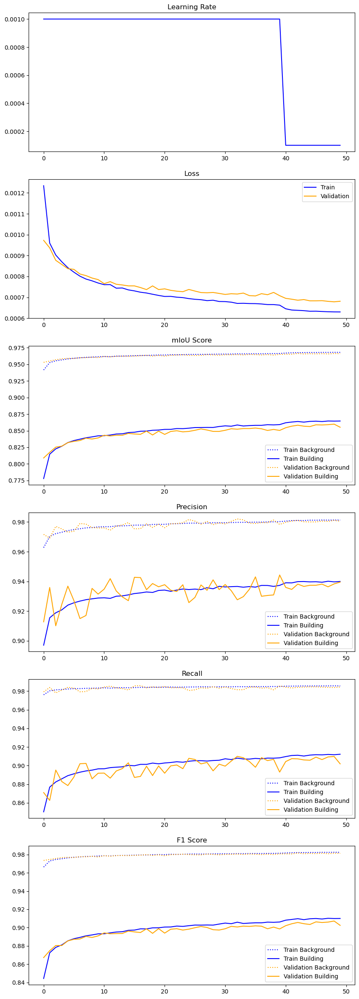

In [12]:
fig, ax = plt.subplots(6, 1, figsize=(10, 30))

# Learning Rate --------------------------------------------------------------------------------------------------
ax[0].plot(
    list(range(len(logs["lr"]))),
    logs["lr"],
    color="blue"
    
)
ax[0].set_title("Learning Rate")

# Loss -----------------------------------------------------------------------------------------------------------
ax[1].plot(
    list(range(len(logs["train"]["loss"]))),
    logs["train"]["loss"],
    label="Train",
    color="blue"
)
ax[1].plot(
    list(range(len(logs["validation"]["loss"]))),
    logs["validation"]["loss"],
    label="Validation",
    color="orange"
)
ax[1].legend()
ax[1].set_title("Loss")

# IoU Score ------------------------------------------------------------------------------------------------------
ax[2].plot(
    list(range(len(logs["train"]["background"]["iou"]))),
    logs["train"]["background"]["iou"],
    label="Train Background",
    color="blue",
    linestyle='dotted'
)
ax[2].plot(
    list(range(len(logs["train"]["building"]["iou"]))),
    logs["train"]["building"]["iou"],
    label="Train Building",
    color="blue",
)
ax[2].plot(
    list(range(len(logs["validation"]["background"]["iou"]))),
    logs["validation"]["background"]["iou"],
    label="Validation Background",
    color="orange",
    linestyle='dotted'
)
ax[2].plot(
    list(range(len(logs["validation"]["building"]["iou"]))),
    logs["validation"]["building"]["iou"],
    label="Validation Building",
    color="orange",
)
ax[2].legend()
ax[2].set_title("mIoU Score")

# Precision ------------------------------------------------------------------------------------------------------
ax[3].plot(
    list(range(len(logs["train"]["background"]["precision"]))),
    logs["train"]["background"]["precision"],
    label="Train Background",
    color="blue",
    linestyle='dotted'
)
ax[3].plot(
    list(range(len(logs["train"]["building"]["precision"]))),
    logs["train"]["building"]["precision"],
    label="Train Building",
    color="blue",
)
ax[3].plot(
    list(range(len(logs["validation"]["background"]["precision"]))),
    logs["validation"]["background"]["precision"],
    label="Validation Background",
    color="orange",
    linestyle='dotted'
)
ax[3].plot(
    list(range(len(logs["validation"]["building"]["precision"]))),
    logs["validation"]["building"]["precision"],
    label="Validation Building",
    color="orange",
)
ax[3].legend()
ax[3].set_title("Precision")

# Recall -----------------------------------------------------------------------------------------------------------
ax[4].plot(
    list(range(len(logs["train"]["background"]["recall"]))),
    logs["train"]["background"]["recall"],
    label="Train Background",
    color="blue",
    linestyle='dotted'
)
ax[4].plot(
    list(range(len(logs["train"]["building"]["recall"]))),
    logs["train"]["building"]["recall"],
    label="Train Building",
    color="blue",
)
ax[4].plot(
    list(range(len(logs["validation"]["background"]["recall"]))),
    logs["validation"]["background"]["recall"],
    label="Validation Background",
    color="orange",
    linestyle='dotted'
)
ax[4].plot(
    list(range(len(logs["validation"]["building"]["recall"]))),
    logs["validation"]["building"]["recall"],
    label="Validation Building",
    color="orange",
)
ax[4].legend()
ax[4].set_title("Recall")

# F1-Score --------------------------------------------------------------------------------------------------------
ax[5].plot(
    list(range(len(logs["train"]["background"]["f1score"]))),
    logs["train"]["background"]["f1score"],
    label="Train Background",
    color="blue",
    linestyle='dotted'
)
ax[5].plot(
    list(range(len(logs["train"]["building"]["f1score"]))),
    logs["train"]["building"]["f1score"],
    label="Train Building",
    color="blue",
)
ax[5].plot(
    list(range(len(logs["validation"]["background"]["f1score"]))),
    logs["validation"]["background"]["f1score"],
    label="Validation Background",
    color="orange",
    linestyle='dotted'
)
ax[5].plot(
    list(range(len(logs["validation"]["building"]["f1score"]))),
    logs["validation"]["building"]["f1score"],
    label="Validation Building",
    color="orange",
)
ax[5].legend()
ax[5].set_title("F1 Score")

fig.savefig(os.path.join(logger.folder, "training_results.svg"))
fig.savefig(os.path.join(logger.folder, "training_results.png"))
plt.show()

In [13]:
logger.log(f"Best Epoch: {BEST_MODEL_EPOCH}")
print(f"Best Epoch: {BEST_MODEL_EPOCH}")
checkpoint = torch.load(os.path.join(logger.folder, f"model_{BEST_MODEL_EPOCH}.pt"))
model.load_state_dict(checkpoint['model_state_dict'])

Best Epoch: 49


<All keys matched successfully>

In [14]:
model.eval()
running_items = 0
running_loss = 0
running_metrics = {
    "background": {
        "iou": 0,
        "precision": 0,
        "recall": 0,
        "f1score": 0
    },
    "building": {
        "iou": 0,
        "precision": 0,
        "recall": 0,
        "f1score": 0
    }
}
with torch.no_grad():
    for X, Y in tqdm(test_loader):
        X, Y = X.to(DEVICE), Y.to(DEVICE)

        pred = model(X)

        loss = loss_fn(pred, Y)

        m = metrics(pred, Y.to(torch.long))
        running_items += m["batch_size"]
        running_loss += loss.item()
        for key, value in m["background"].items():
            running_metrics["background"][key] += value

        for key, value in m["building"].items():
            running_metrics["building"][key] += value
        
        
for key, value in m["background"].items():
    running_metrics["background"][key] = running_metrics["background"][key] / running_items

for key, value in m["building"].items():
    running_metrics["building"][key] = running_metrics["building"][key] / running_items
    
logs["test"] = running_metrics
logs["test"]["loss"] = running_loss / running_items

with open(os.path.join(logger.folder, "raw_data.json"), "w") as file:
    json.dump(logs, file, indent=4)

100%|██████████| 625/625 [2:16:07<00:00, 13.07s/it]  


Background: {'iou': 0.9963569641113281, 'precision': 0.9963569641113281, 'recall': 1.0, 'f1score': 0.9981751441955566}
Building: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}


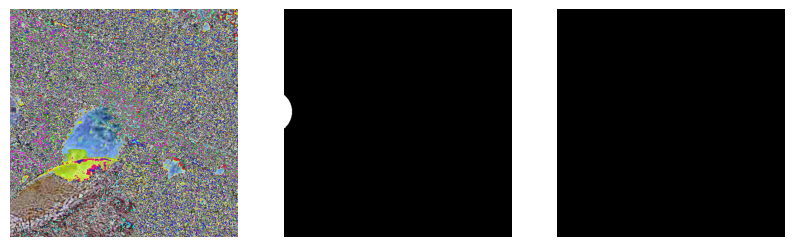

Background: {'iou': 0.9710895419120789, 'precision': 0.9784770011901855, 'recall': 0.9922852516174316, 'f1score': 0.985332727432251}
Building: {'iou': 0.7890825271606445, 'precision': 0.9347508549690247, 'recall': 0.8350794911384583, 'f1score': 0.8821085691452026}


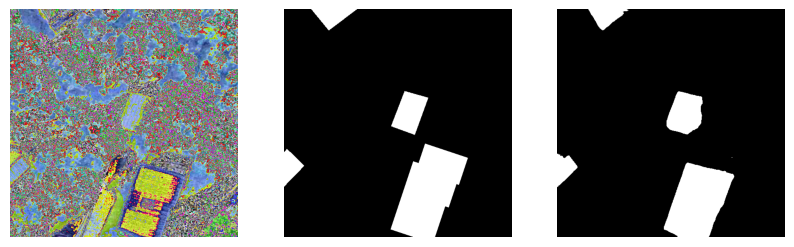

Background: {'iou': 0.9883590340614319, 'precision': 0.9948567152023315, 'recall': 0.9934352040290833, 'f1score': 0.9941454529762268}
Building: {'iou': 0.9296056032180786, 'precision': 0.9592453241348267, 'recall': 0.9678304195404053, 'f1score': 0.9635187387466431}


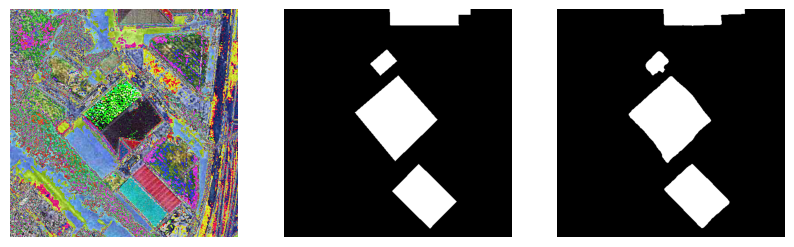

Background: {'iou': 0.98786860704422, 'precision': 0.995470404624939, 'recall': 0.9923291206359863, 'f1score': 0.9938972592353821}
Building: {'iou': 0.8967633247375488, 'precision': 0.9324303865432739, 'recall': 0.9590896964073181, 'f1score': 0.9455721974372864}


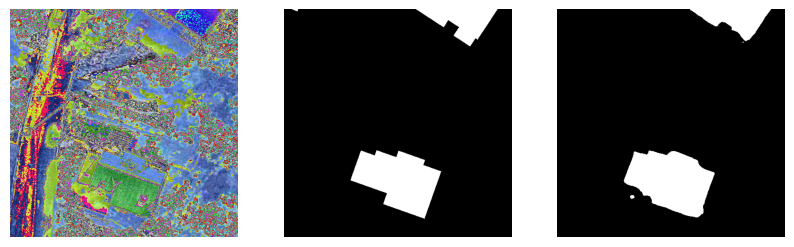

Background: {'iou': 0.9967914819717407, 'precision': 0.9992718696594238, 'recall': 0.9975159764289856, 'f1score': 0.998393177986145}
Building: {'iou': 0.9349725246429443, 'precision': 0.9489410519599915, 'recall': 0.9845001101493835, 'f1score': 0.9663935899734497}


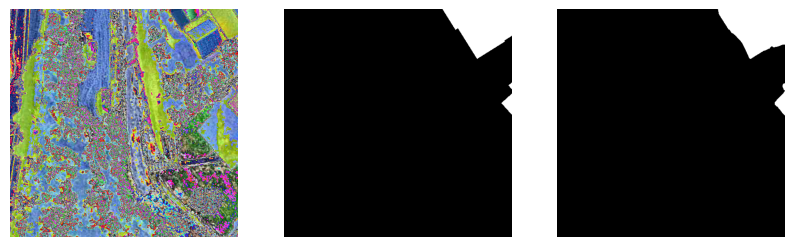

Background: {'iou': 0.978864312171936, 'precision': 0.9825062155723572, 'recall': 0.996227502822876, 'f1score': 0.9893192648887634}
Building: {'iou': 0.9314107894897461, 'precision': 0.9872498512268066, 'recall': 0.9427511692047119, 'f1score': 0.9644875526428223}


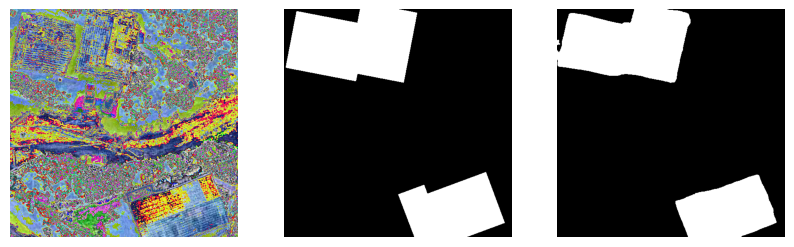

Background: {'iou': 0.9974349141120911, 'precision': 0.9974349141120911, 'recall': 1.0, 'f1score': 0.9987158179283142}
Building: {'iou': 0.813254714012146, 'precision': 1.0, 'recall': 0.813254714012146, 'f1score': 0.8970109820365906}


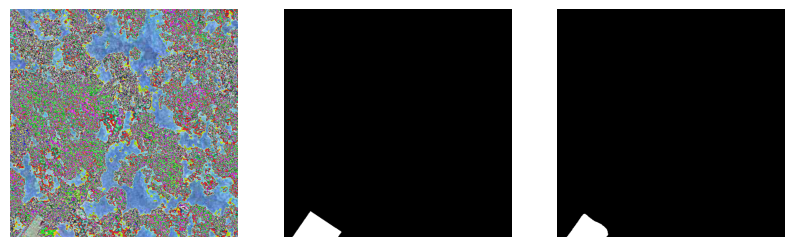

Background: {'iou': 0.9988825917243958, 'precision': 0.999197244644165, 'recall': 0.9996848702430725, 'f1score': 0.9994409680366516}
Building: {'iou': 0.8550074696540833, 'precision': 0.954393744468689, 'recall': 0.8914285898208618, 'f1score': 0.9218372106552124}


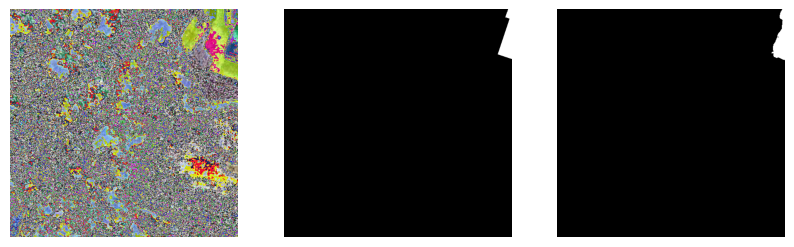

Background: {'iou': 0.9507489800453186, 'precision': 0.9607288837432861, 'recall': 0.9891921281814575, 'f1score': 0.9747527837753296}
Building: {'iou': 0.8561073541641235, 'precision': 0.9657633304595947, 'recall': 0.8829028606414795, 'f1score': 0.9224761128425598}


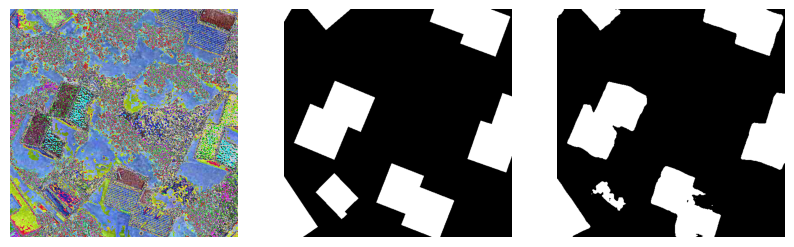

Background: {'iou': 0.9541662335395813, 'precision': 0.9575169682502747, 'recall': 0.9963459372520447, 'f1score': 0.9765456318855286}
Building: {'iou': 0.809257447719574, 'precision': 0.9823224544525146, 'recall': 0.821216881275177, 'f1score': 0.8945741057395935}


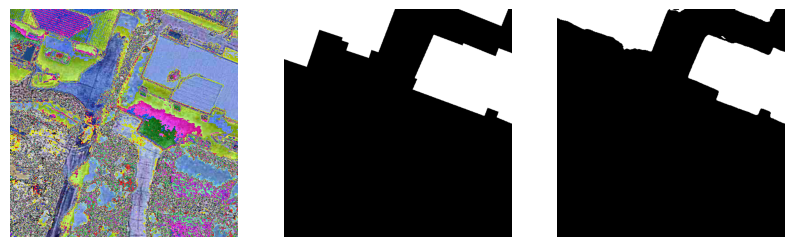

Background: {'iou': 0.9989617466926575, 'precision': 0.9990427494049072, 'recall': 0.9999188780784607, 'f1score': 0.9994806051254272}
Building: {'iou': 0.9190490245819092, 'precision': 0.9931707382202148, 'recall': 0.9248939752578735, 'f1score': 0.9578171372413635}


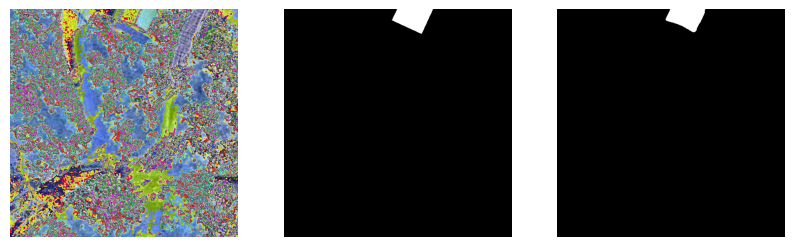

Background: {'iou': 0.9816111922264099, 'precision': 0.9949634671211243, 'recall': 0.9865131378173828, 'f1score': 0.990720272064209}
Building: {'iou': 0.9155778884887695, 'precision': 0.9369518756866455, 'recall': 0.9756900072097778, 'f1score': 0.9559286236763}


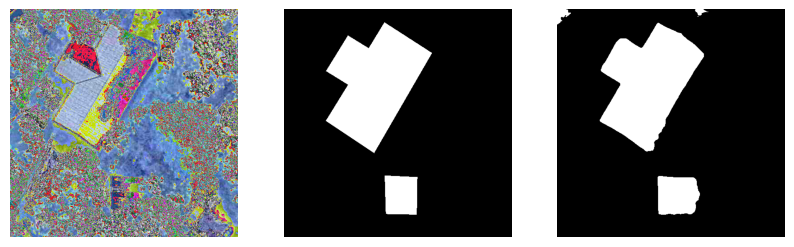

Background: {'iou': 0.984440267086029, 'precision': 0.9963021278381348, 'recall': 0.9880504012107849, 'f1score': 0.9921591281890869}
Building: {'iou': 0.8854455351829529, 'precision': 0.90992271900177, 'recall': 0.9705151915550232, 'f1score': 0.9392427206039429}


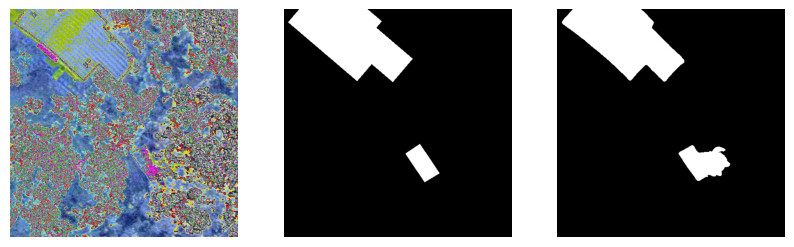

Background: {'iou': 0.977688193321228, 'precision': 0.9873037338256836, 'recall': 0.9901368021965027, 'f1score': 0.9887182116508484}
Building: {'iou': 0.9368696212768555, 'precision': 0.9714268445968628, 'recall': 0.9634182453155518, 'f1score': 0.9674059748649597}


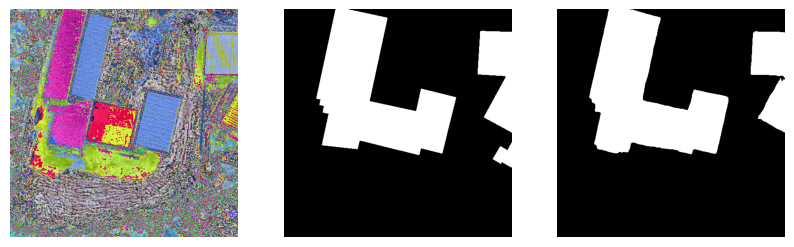

Background: {'iou': 0.970120370388031, 'precision': 0.9819235801696777, 'recall': 0.9877609610557556, 'f1score': 0.9848335981369019}
Building: {'iou': 0.9485379457473755, 'precision': 0.9786399602890015, 'recall': 0.9685906767845154, 'f1score': 0.9735894203186035}


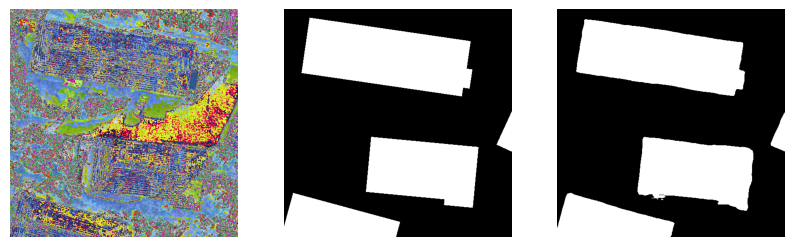

Background: {'iou': 0.992003858089447, 'precision': 0.9965885281562805, 'recall': 0.9953839778900146, 'f1score': 0.9959858655929565}
Building: {'iou': 0.9373975992202759, 'precision': 0.9629998803138733, 'recall': 0.9724207520484924, 'f1score': 0.9676873683929443}


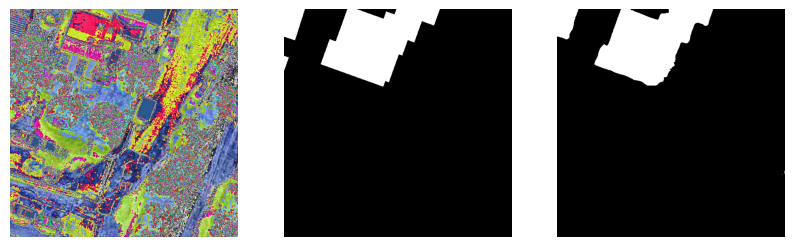

Background: {'iou': 0.9518613815307617, 'precision': 0.9572534561157227, 'recall': 0.9941170811653137, 'f1score': 0.9753370881080627}
Building: {'iou': 0.8895743489265442, 'precision': 0.9856827855110168, 'recall': 0.9012192487716675, 'f1score': 0.9415605664253235}


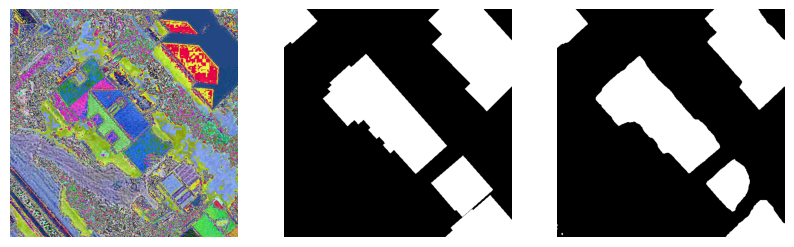

Background: {'iou': 0.977142333984375, 'precision': 0.9915094971656799, 'recall': 0.9853875637054443, 'f1score': 0.9884390234947205}
Building: {'iou': 0.4864722788333893, 'precision': 0.5990942716598511, 'recall': 0.7212774157524109, 'f1score': 0.6545326113700867}


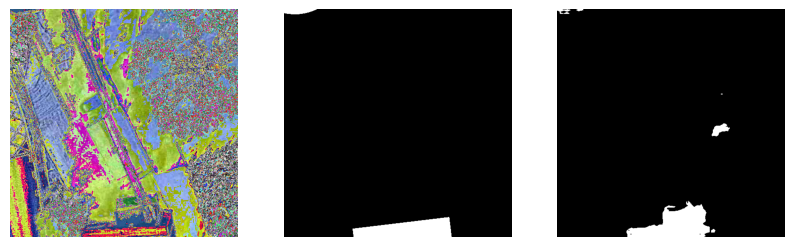

Background: {'iou': 0.9805018901824951, 'precision': 0.9808933734893799, 'recall': 0.9995931386947632, 'f1score': 0.9901549816131592}
Building: {'iou': 0.8216594457626343, 'precision': 0.9955768585205078, 'recall': 0.8246698975563049, 'f1score': 0.9020999670028687}


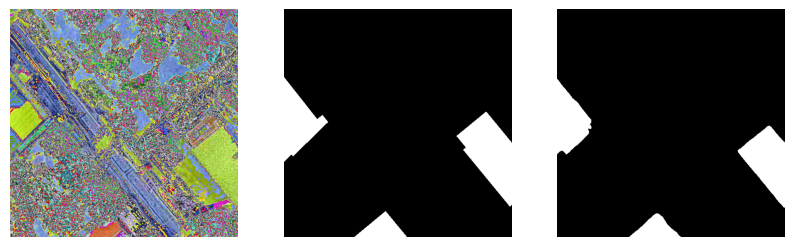

Background: {'iou': 0.8994446396827698, 'precision': 0.9244939684867859, 'recall': 0.9707565903663635, 'f1score': 0.9470606446266174}
Building: {'iou': 0.8575134873390198, 'precision': 0.9571453332901001, 'recall': 0.8917511701583862, 'f1score': 0.923291802406311}


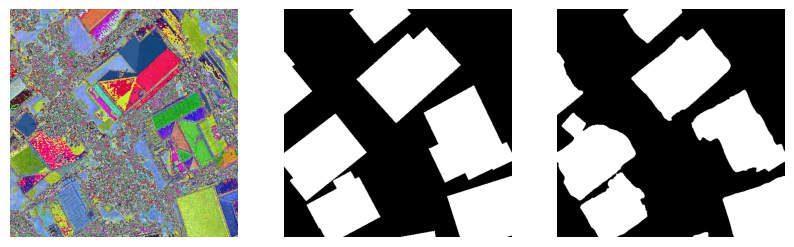

Background: {'iou': 0.9945610165596008, 'precision': 0.9967676997184753, 'recall': 0.9977790117263794, 'f1score': 0.9972730875015259}
Building: {'iou': 0.9544256925582886, 'precision': 0.9809346199035645, 'recall': 0.9724650979042053, 'f1score': 0.9766814708709717}


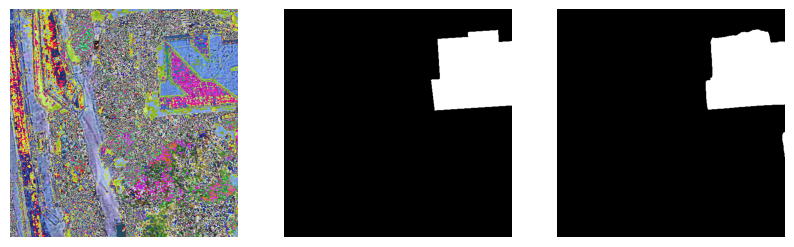

Background: {'iou': 0.9900246858596802, 'precision': 0.9944964647293091, 'recall': 0.9954786896705627, 'f1score': 0.9949873685836792}
Building: {'iou': 0.9353844523429871, 'precision': 0.9698017835617065, 'recall': 0.9634462594985962, 'f1score': 0.9666135907173157}


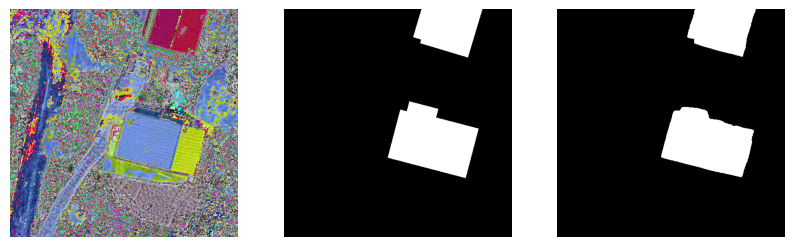

Background: {'iou': 0.9777330160140991, 'precision': 0.9834128022193909, 'recall': 0.9941275715827942, 'f1score': 0.9887411594390869}
Building: {'iou': 0.9185948967933655, 'precision': 0.9775305986404419, 'recall': 0.938409149646759, 'f1score': 0.957570493221283}


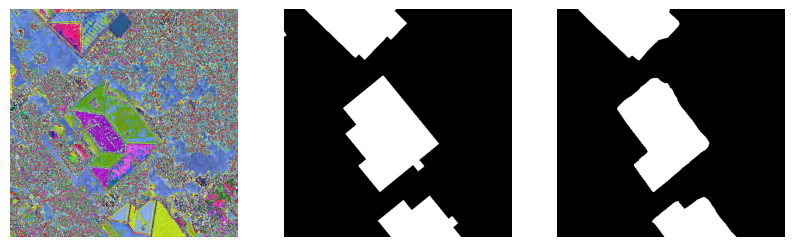

Background: {'iou': 0.9753860235214233, 'precision': 0.9794918298721313, 'recall': 0.9957208633422852, 'f1score': 0.9875396490097046}
Building: {'iou': 0.8535313010215759, 'precision': 0.9716058373451233, 'recall': 0.8753660321235657, 'f1score': 0.9209785461425781}


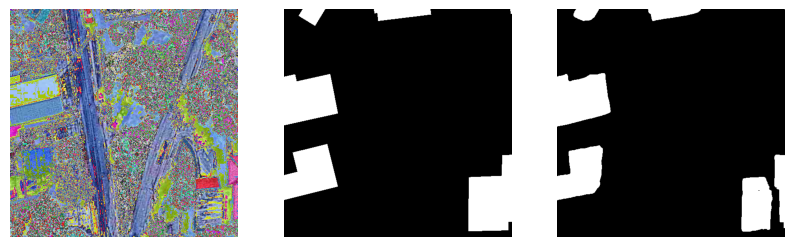

Background: {'iou': 0.9468366503715515, 'precision': 0.9486503005027771, 'recall': 0.9979848861694336, 'f1score': 0.9726924300193787}
Building: {'iou': 0.8263225555419922, 'precision': 0.9924982786178589, 'recall': 0.831515908241272, 'f1score': 0.9049031734466553}


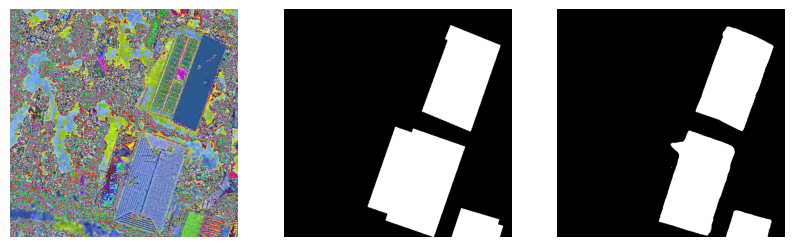

In [15]:
model.eval()
with torch.no_grad():
    for i in range(25):
        X, Y = test_dataset.__getitem__(i)
        X, Y = X.to(DEVICE).unsqueeze(0), Y.to(DEVICE).unsqueeze(0)
        
        pred = model(X)
        
        m = metrics(pred, Y.to(torch.long))
        
        print("=========================================================")
        print(f"Background: {m['background']}")
        print(f"Building: {m['building']}")
        
        _, ax = plt.subplots(1, 3, figsize=(10, 5))
        
        ax[0].imshow(transforms.ToPILImage()(X[0]))
        ax[1].imshow(transforms.ToPILImage()(Y.argmax(dim=1).float()), cmap="gray")
        ax[2].imshow(transforms.ToPILImage()(pred.argmax(dim=1).float()), cmap="gray")
        
        ax[0].axis("off")
        ax[1].axis("off")
        ax[2].axis("off")
        
        plt.show()

In [16]:
running_metrics

{'background': {'iou': 0.9673945569992065,
  'precision': 0.9813698661804199,
  'recall': 0.9848592746734619,
  'f1score': 0.9820945508956909},
 'building': {'iou': 0.8629814296722412,
  'precision': 0.9425070485115051,
  'recall': 0.9074375212669372,
  'f1score': 0.9110002572059631},
 'loss': 0.0006653640806674957}